## Importing libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Loading data

In [2]:
df = pd.read_csv('/kaggle/input/airbnb-listing-eda/listings.csv')
df.shape

(17230, 75)

## Data Exploration

In [3]:
df

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,18674,https://www.airbnb.com/rooms/18674,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★4.35 · 3 bedrooms ...,110m2 apartment to rent in Barcelona. Located ...,Apartment in Barcelona located in the heart of...,https://a0.muscache.com/pictures/13031453/413c...,71615,...,4.71,4.82,4.32,HUTB-002062,t,28,28,0,0,0.29
1,23197,https://www.airbnb.com/rooms/23197,20230610001920,2023-06-10,city scrape,Rental unit in Sant Adria de Besos · ★4.77 · 3...,"Beautiful spacious apartment, large terrace, 5...","Strategically located in the Parc del Fòrum, a...",https://a0.muscache.com/pictures/miso/Hosting-...,90417,...,4.99,4.61,4.63,HUTB005057,f,2,2,0,0,0.48
2,32711,https://www.airbnb.com/rooms/32711,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★4.43 · 2 bedrooms ...,A lovely two bedroom apartment only 250 m from...,What's nearby <br />This apartment is located...,https://a0.muscache.com/pictures/357b25e4-f414...,135703,...,4.85,4.86,4.52,HUTB-001722,t,3,3,0,0,0.63
3,41952,https://www.airbnb.com/rooms/41952,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★4.35 · 2 bedrooms ...,Bright new apartment located in the middle of ...,NaN,https://a0.muscache.com/pictures/4215368/059dc...,183340,...,4.49,4.70,4.33,HUTB-003549,t,5,5,0,0,0.49
4,46153,https://www.airbnb.com/rooms/46153,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★4.20 · 2 bedrooms ...,Coming to visit Barcelona this summer? <br />W...,Centrally located in the charming old town of ...,https://a0.muscache.com/pictures/d84e064c-6235...,90417,...,4.40,4.40,3.80,Exempt,f,2,2,0,0,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17225,909333050152586756,https://www.airbnb.com/rooms/909333050152586756,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★New · 1 bedroom · ...,A big bedroom in a beautiful shared and bright...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,492807178,...,NaN,NaN,NaN,Exempt,t,33,1,32,0,NaN
17226,909347845538314221,https://www.airbnb.com/rooms/909347845538314221,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★New · 2 bedrooms ·...,Centric apartment with great views in a high f...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,239550764,...,NaN,NaN,NaN,NaN,f,23,18,5,0,NaN
17227,909355184941954314,https://www.airbnb.com/rooms/909355184941954314,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★New · 1 bedroom · ...,Bright SHARED apartment situated in a gorgeous...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,492807178,...,NaN,NaN,NaN,Exempt,t,33,1,32,0,NaN
17228,909364014604079283,https://www.airbnb.com/rooms/909364014604079283,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★New · 1 bedroom · ...,Amazing Apartment with Private Balconies in th...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,492807178,...,NaN,NaN,NaN,Exempt,t,33,1,32,0,NaN


In [4]:
df.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,1.723000e+04,1.723000e+04,1.723000e+04,17228.000000,17228.000000,17230.000000,17230.000000,17230.000000,0.0,11336.000000,...,13112.000000,13107.000000,13113.000000,13108.00000,13108.000000,17230.000000,17230.000000,17230.000000,17230.000000,13198.000000
mean,2.452457e+17,2.023061e+13,1.577106e+08,37.918215,52.249245,41.391854,2.167149,3.409460,NaN,2.066778,...,4.583499,4.711706,4.710808,4.74363,4.451830,28.073244,22.654266,5.265293,0.081254,1.438544
std,3.583623e+17,0.000000e+00,1.652453e+08,83.089053,126.634095,0.013882,0.017245,2.145476,NaN,1.137501,...,0.509120,0.449670,0.468099,0.37379,0.545841,53.164134,50.965244,21.016104,0.732180,1.839384
min,1.867400e+04,2.023061e+13,3.073000e+03,1.000000,1.000000,41.352608,2.091590,0.000000,NaN,1.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.010000
25%,2.043217e+07,2.023061e+13,9.536735e+06,2.000000,2.000000,41.381040,2.157150,2.000000,NaN,1.000000,...,4.440000,4.640000,4.640000,4.67000,4.290000,1.000000,0.000000,0.000000,0.000000,0.230000
50%,4.215769e+07,2.023061e+13,8.489767e+07,6.000000,8.000000,41.389566,2.168260,3.000000,NaN,2.000000,...,4.710000,4.850000,4.850000,4.84000,4.570000,5.000000,2.000000,0.000000,0.000000,0.870000
75%,6.601314e+17,2.023061e+13,2.871165e+08,31.000000,44.000000,41.401190,2.177500,4.000000,NaN,3.000000,...,4.920000,5.000000,5.000000,5.00000,4.780000,25.000000,18.000000,2.000000,0.000000,2.100000
max,9.100075e+17,2.023061e+13,5.185810e+08,2183.000000,4442.000000,41.459560,2.227710,16.000000,NaN,20.000000,...,5.000000,5.000000,5.000000,5.00000,5.000000,265.000000,265.000000,135.000000,12.000000,50.640000


/tmp/ipykernel_32/3556985313.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr())


<Axes: >

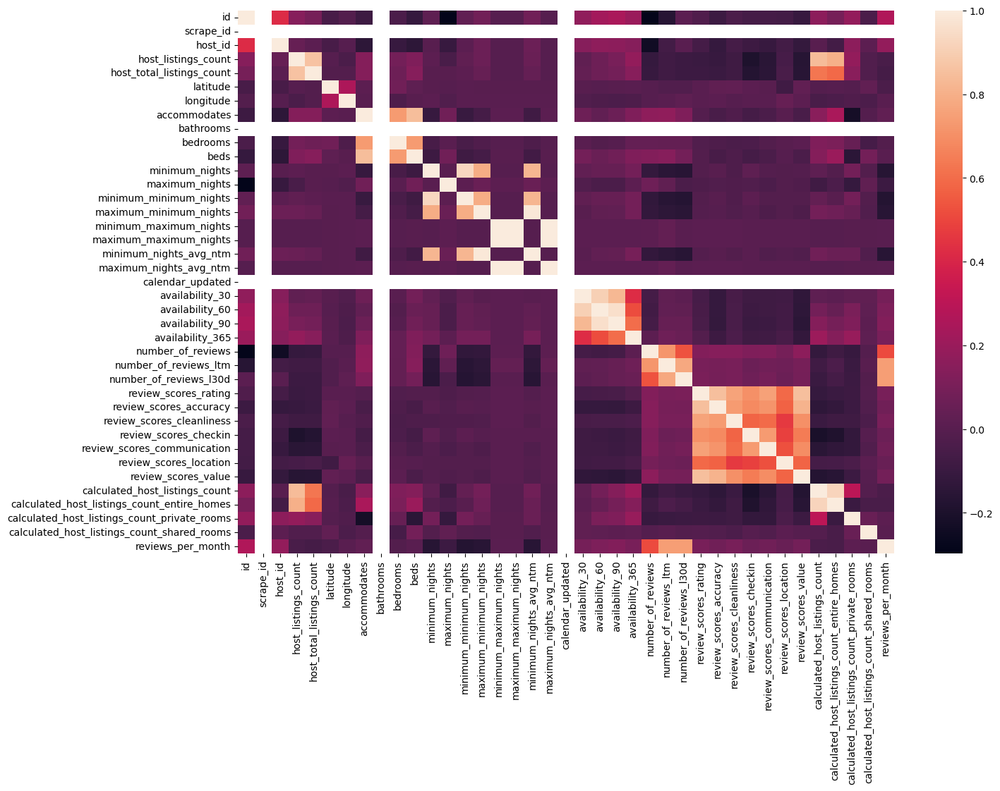

In [5]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr())

## Data Filteration

In [6]:
df.isna()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17225,False,False,False,False,False,False,False,True,False,False,...,True,True,True,False,False,False,False,False,False,True
17226,False,False,False,False,False,False,False,True,False,False,...,True,True,True,True,False,False,False,False,False,True
17227,False,False,False,False,False,False,False,True,False,False,...,True,True,True,False,False,False,False,False,False,True
17228,False,False,False,False,False,False,False,True,False,False,...,True,True,True,False,False,False,False,False,False,True


In [7]:
df.info

<bound method DataFrame.info of                        id                                      listing_url  \
0                   18674               https://www.airbnb.com/rooms/18674   
1                   23197               https://www.airbnb.com/rooms/23197   
2                   32711               https://www.airbnb.com/rooms/32711   
3                   41952               https://www.airbnb.com/rooms/41952   
4                   46153               https://www.airbnb.com/rooms/46153   
...                   ...                                              ...   
17225  909333050152586756  https://www.airbnb.com/rooms/909333050152586756   
17226  909347845538314221  https://www.airbnb.com/rooms/909347845538314221   
17227  909355184941954314  https://www.airbnb.com/rooms/909355184941954314   
17228  909364014604079283  https://www.airbnb.com/rooms/909364014604079283   
17229  909387630966968007  https://www.airbnb.com/rooms/909387630966968007   

            scrape_id last_scra

In [8]:
df['reviews_per_month'].fillna(0,inplace=True)
df['license'].fillna('No license',inplace=True)
df['review_scores_value'].fillna(0,inplace=True)
df['review_scores_communication'].fillna(0,inplace=True)
df['review_scores_location'].fillna(0,inplace=True)
df=df.dropna(axis=1)
df

,id,listing_url,scrape_id,last_scraped,source,name,picture_url,host_id,host_url,host_verifications,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,18674,https://www.airbnb.com/rooms/18674,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★4.35 · 3 bedrooms ...,https://a0.muscache.com/pictures/13031453/413c...,71615,https://www.airbnb.com/users/show/71615,"['email', 'phone']",...,4.71,4.82,4.32,HUTB-002062,t,28,28,0,0,0.29
1,23197,https://www.airbnb.com/rooms/23197,20230610001920,2023-06-10,city scrape,Rental unit in Sant Adria de Besos · ★4.77 · 3...,https://a0.muscache.com/pictures/miso/Hosting-...,90417,https://www.airbnb.com/users/show/90417,"['email', 'phone']",...,4.99,4.61,4.63,HUTB005057,f,2,2,0,0,0.48
2,32711,https://www.airbnb.com/rooms/32711,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★4.43 · 2 bedrooms ...,https://a0.muscache.com/pictures/357b25e4-f414...,135703,https://www.airbnb.com/users/show/135703,"['email', 'phone', 'work_email']",...,4.85,4.86,4.52,HUTB-001722,t,3,3,0,0,0.63
3,41952,https://www.airbnb.com/rooms/41952,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★4.35 · 2 bedrooms ...,https://a0.muscache.com/pictures/4215368/059dc...,183340,https://www.airbnb.com/users/show/183340,"['email', 'phone']",...,4.49,4.70,4.33,HUTB-003549,t,5,5,0,0,0.49
4,46153,https://www.airbnb.com/rooms/46153,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★4.20 · 2 bedrooms ...,https://a0.muscache.com/pictures/d84e064c-6235...,90417,https://www.airbnb.com/users/show/90417,"['email', 'phone']",...,4.40,4.40,3.80,Exempt,f,2,2,0,0,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17225,909333050152586756,https://www.airbnb.com/rooms/909333050152586756,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★New · 1 bedroom · ...,https://a0.muscache.com/pictures/miso/Hosting-...,492807178,https://www.airbnb.com/users/show/492807178,"['email', 'phone']",...,0.00,0.00,0.00,Exempt,t,33,1,32,0,0.00
17226,909347845538314221,https://www.airbnb.com/rooms/909347845538314221,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★New · 2 bedrooms ·...,https://a0.muscache.com/pictures/miso/Hosting-...,239550764,https://www.airbnb.com/users/show/239550764,"['email', 'phone']",...,0.00,0.00,0.00,No license,f,23,18,5,0,0.00
17227,909355184941954314,https://www.airbnb.com/rooms/909355184941954314,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★New · 1 bedroom · ...,https://a0.muscache.com/pictures/miso/Hosting-...,492807178,https://www.airbnb.com/users/show/492807178,"['email', 'phone']",...,0.00,0.00,0.00,Exempt,t,33,1,32,0,0.00
17228,909364014604079283,https://www.airbnb.com/rooms/909364014604079283,20230610001920,2023-06-10,city scrape,Rental unit in Barcelona · ★New · 1 bedroom · ...,https://a0.muscache.com/pictures/miso/Hosting-...,492807178,https://www.airbnb.com/users/show/492807178,"['email', 'phone']",...,0.00,0.00,0.00,Exempt,t,33,1,32,0,0.00


In [9]:
df.drop(['id','host_id','listing_url','scrape_id','last_scraped','source','picture_url','review_scores_communication','review_scores_location','host_url','neighbourhood_group_cleansed','latitude','longitude','availability_60','number_of_reviews_ltm'],axis=1,inplace=True)
df

/tmp/ipykernel_32/150977115.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(['id','host_id','listing_url','scrape_id','last_scraped','source','picture_url','review_scores_communication','review_scores_location','host_url','neighbourhood_group_cleansed','latitude','longitude','availability_60','number_of_reviews_ltm'],axis=1,inplace=True)


,name,host_verifications,neighbourhood_cleansed,property_type,room_type,accommodates,amenities,price,minimum_nights,maximum_nights,...,number_of_reviews,number_of_reviews_l30d,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,Rental unit in Barcelona · ★4.35 · 3 bedrooms ...,"['email', 'phone']",la Sagrada Família,Entire rental unit,Entire home/apt,8,"[""Refrigerator"", ""Hangers"", ""Wifi"", ""30\"" TV"",...",$210.00,1,1125,...,35,0,4.32,HUTB-002062,t,28,28,0,0,0.29
1,Rental unit in Sant Adria de Besos · ★4.77 · 3...,"['email', 'phone']",el Besòs i el Maresme,Entire rental unit,Entire home/apt,5,"[""Fire extinguisher"", ""Oven"", ""Refrigerator"", ...",$250.00,4,300,...,72,2,4.63,HUTB005057,f,2,2,0,0,0.48
2,Rental unit in Barcelona · ★4.43 · 2 bedrooms ...,"['email', 'phone', 'work_email']",el Camp d'en Grassot i Gràcia Nova,Entire rental unit,Entire home/apt,6,"[""Fire extinguisher"", ""Smart lock"", ""Oven"", ""R...",$186.00,2,31,...,91,0,4.52,HUTB-001722,t,3,3,0,0,0.63
3,Rental unit in Barcelona · ★4.35 · 2 bedrooms ...,"['email', 'phone']",el Camp d'en Grassot i Gràcia Nova,Entire rental unit,Entire home/apt,4,"[""Kitchen"", ""Dryer"", ""Refrigerator"", ""Air cond...",$172.00,3,365,...,66,2,4.33,HUTB-003549,t,5,5,0,0,0.49
4,Rental unit in Barcelona · ★4.20 · 2 bedrooms ...,"['email', 'phone']","Sant Pere, Santa Caterina i la Ribera",Entire rental unit,Entire home/apt,2,"[""Refrigerator"", ""Hangers"", ""Wifi"", ""Portable ...",$63.00,31,186,...,5,0,3.80,Exempt,f,2,2,0,0,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17225,Rental unit in Barcelona · ★New · 1 bedroom · ...,"['email', 'phone']","Sant Pere, Santa Caterina i la Ribera",Private room in rental unit,Private room,3,"[""Kitchen"", ""Wifi""]",$65.00,1,365,...,0,0,0.00,Exempt,t,33,1,32,0,0.00
17226,Rental unit in Barcelona · ★New · 2 bedrooms ·...,"['email', 'phone']",Sant Gervasi - la Bonanova,Entire rental unit,Entire home/apt,4,"[""Fire extinguisher"", ""Kitchen"", ""Air conditio...",$63.00,31,365,...,0,0,0.00,No license,f,23,18,5,0,0.00
17227,Rental unit in Barcelona · ★New · 1 bedroom · ...,"['email', 'phone']",el Barri Gòtic,Private room in rental unit,Private room,3,"[""Kitchen"", ""Wifi""]",$65.00,1,365,...,0,0,0.00,Exempt,t,33,1,32,0,0.00
17228,Rental unit in Barcelona · ★New · 1 bedroom · ...,"['email', 'phone']",el Raval,Entire rental unit,Entire home/apt,3,"[""Kitchen"", ""Wifi""]",$100.00,1,365,...,0,0,0.00,Exempt,t,33,1,32,0,0.00


/tmp/ipykernel_32/137295111.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr())


<Axes: >

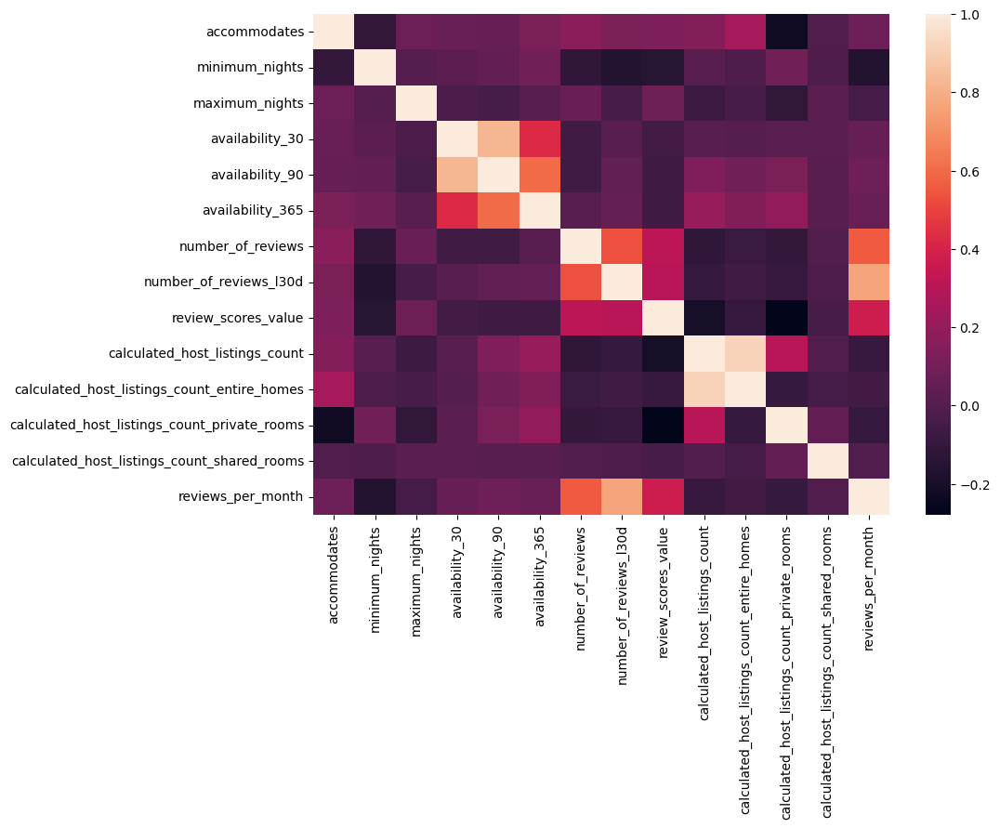

In [10]:
plt.figure(figsize=(10,7))
sns.heatmap(df.corr())

In [11]:
df.columns

Index(['name', 'host_verifications', 'neighbourhood_cleansed', 'property_type',
       'room_type', 'accommodates', 'amenities', 'price', 'minimum_nights',
       'maximum_nights', 'has_availability', 'availability_30',
       'availability_90', 'availability_365', 'calendar_last_scraped',
       'number_of_reviews', 'number_of_reviews_l30d', 'review_scores_value',
       'license', 'instant_bookable', 'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month'],
      dtype='object')

In [12]:
df=df.sort_values(by='review_scores_value',ascending=False)
df

,name,host_verifications,neighbourhood_cleansed,property_type,room_type,accommodates,amenities,price,minimum_nights,maximum_nights,...,number_of_reviews,number_of_reviews_l30d,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
8615,Condo in Barcelona · 1 bedroom · 2 beds · 1.5 ...,"['email', 'phone', 'work_email']",la Dreta de l'Eixample,Entire condo,Entire home/apt,4,"[""Oven"", ""Pets allowed"", ""Refrigerator"", ""Wine...",$71.00,32,1125,...,1,0,5.0,No license,f,3,3,0,0,0.38
4151,Rental unit in Barcelona · 1 bedroom · 2 beds ...,"['email', 'phone']",la Barceloneta,Entire rental unit,Entire home/apt,2,"[""Shampoo"", ""Kitchen"", ""Air conditioning"", ""Ho...",$58.00,210,335,...,1,0,5.0,No license,f,1,1,0,0,0.02
16184,Rental unit in Barcelona · ★New · 1 bedroom · ...,"['email', 'phone']",Sant Gervasi - Galvany,Private room in rental unit,Private room,2,"[""Kitchen"", ""Pets allowed"", ""Air conditioning""...",$69.00,1,365,...,2,2,5.0,No license,t,3,0,3,0,2.00
4121,Serviced apartment in Barcelona · 1 bedroom · ...,['phone'],el Fort Pienc,Private room in serviced apartment,Private room,2,"[""Paid parking on premises"", ""Fire extinguishe...",$66.00,3,1125,...,2,0,5.0,No license,t,12,0,12,0,0.03
16185,Rental unit in Barcelona · ★New · 5 bedrooms ·...,"['email', 'phone']",la Vila de Gràcia,Entire rental unit,Entire home/apt,6,"[""Pets allowed"", ""Refrigerator"", ""Wine glasses...",$263.00,3,25,...,1,1,5.0,HUTB-005831,f,3,3,0,0,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13148,Rental unit in Barcelona · 1 bedroom · 1 bed ·...,"['email', 'phone']",Sant Antoni,Private room in rental unit,Private room,1,"[""Kitchen"", ""Hangers"", ""Washer"", ""Dedicated wo...",$26.00,33,360,...,0,0,0.0,No license,f,138,3,135,0,0.00
13140,Serviced apartment in Barcelona · ★New · 1 bed...,"['email', 'phone']",Sant Gervasi - Galvany,Entire serviced apartment,Entire home/apt,2,"[""Fire extinguisher"", ""Refrigerator"", ""Wine gl...",$200.00,2,330,...,0,0,0.0,HUTB-003631,t,10,10,0,0,0.00
5241,Rental unit in Barcelona · 3 bedrooms · 3 beds...,"['email', 'phone']",la Dreta de l'Eixample,Entire rental unit,Entire home/apt,5,"[""Paid parking on premises"", ""Kitchen"", ""High ...",$100.00,32,1125,...,0,0,0.0,No license,f,141,141,0,0,0.00
13136,Rental unit in Barcelona · 2 bedrooms · 3 beds...,"['email', 'phone', 'work_email']",la Sagrada Família,Entire rental unit,Entire home/apt,5,"[""Shampoo"", ""Kitchen"", ""Air conditioning"", ""Ha...","$1,000.00",99,365,...,0,0,0.0,No license,f,21,21,0,0,0.00


## summary 

In [13]:
pd.crosstab(df['price'],df['maximum_nights']).T.head(20)

price,$0.00,"$1,000.00","$1,004.00","$1,011.00","$1,014.00","$1,023.00","$1,033.00","$1,036.00","$1,038.00","$1,048.00",...,$97.00,$970.00,$971.00,$972.00,$98.00,$981.00,$985.00,$99.00,$997.00,$999.00
maximum_nights,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [14]:
pd.crosstab(df['price'],df['minimum_nights']).T.head(20)

price,$0.00,"$1,000.00","$1,004.00","$1,011.00","$1,014.00","$1,023.00","$1,033.00","$1,036.00","$1,038.00","$1,048.00",...,$97.00,$970.00,$971.00,$972.00,$98.00,$981.00,$985.00,$99.00,$997.00,$999.00
minimum_nights,,,,,,,,,,,,,,,,,,,,,
1,1,4,1,2,0,0,0,0,0,0,...,11,1,0,1,10,1,1,5,5,13
2,0,1,0,0,1,1,0,0,0,0,...,9,0,1,0,7,0,0,11,0,0
3,0,3,0,0,0,0,1,2,1,0,...,8,0,0,0,3,0,0,6,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,2,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Univariate

In [73]:
fig= px.histogram(df,x='price')
fig.show()

## find relation between review_scores_value and df

In [79]:

fig= px.box(df,y='review_scores_value')
fig.show()

## plot neighbourhood_cleansed as pie chart

In [22]:
fig= px.bar(df,x='instant_bookable',color='instant_bookable')
fig.show()

## Multivariate number of nights with price

In [16]:
fig= px.histogram(df,x='minimum_nights',y='price')
fig.show()

In [17]:
fig= px.histogram(df,x='price',y='maximum_nights')
fig.show()

## price with room type

In [18]:
fig= px.bar(df,x='room_type',y='price',color='room_type')
fig.show()

## Room type with maximum nights

In [19]:
fig = px.histogram(df,x='room_type',y='maximum_nights')
fig.show()

## neighbourhood cleansed with reviews

In [77]:
fig= px.histogram(df,x='neighbourhood_cleansed',y='review_scores_value')
fig.show()

## Is high score mean high cost(price)?

In [25]:
fig=px.scatter(df,x='price',y='review_scores_value')
fig.show()

## The relation between neighbourhood and license

In [23]:
fig=px.scatter(df,x='neighbourhood_cleansed',y='license',height=1000)
fig.show()

## Is price affected by accommodates ?

In [75]:
fig=px.scatter(df,x='price',y='accommodates')
fig.show()

## Is max nights affected by verifications ?

In [24]:
fig = px.scatter(df,x='host_verifications',y='minimum_nights')
f = px.scatter(df,x='host_verifications',y='maximum_nights')
fig.show()
f.show()

## Is reviews affected by amenities?

In [72]:
fig=px.scatter(df,x='amenities',y='review_scores_value')
fig.show()